In [1]:
import xarray as xr
import matplotlib.pylab as plt
import numpy as np
import pyinterp
import glob
from PIL import Image
import cmocean
import proplot as plot

/home/mballarotta/.conda/envs/my_conda/lib/python3.7/_collections_abc.py:841: MatplotlibDeprecationWarning: 
The examples.directory rcparam was deprecated in Matplotlib 3.0 and will be removed in 3.2. In the future, examples will be found relative to the 'datapath' directory.
  self[key] = other[key]


In [ ]:
#import os
#os.environ['SGE_ROOT'] = '/opt/sge'

In [ ]:
#from distributed import Client, LocalCluster
#import dask_jobqueue

## cluster = LocalCluster()

#cluster = dask_jobqueue.SGECluster(queue='short',
#                                   cores=8,
#                                   memory='4GB',
#                                   resource_spec='mem_total=4G',
#                                   processes=2,
#                                   local_directory='$TMPDIR')
#cluster.scale(365)

#client = Client(cluster)
#client

In [ ]:
time_vector = np.arange(np.datetime64('2017-10-23'), np.datetime64('2018-01-01'))

In [2]:
# DUACS maps
grid_files_duacs = 'OSE_GULFSTREAM_FPGENN_clean.nc'
grid_files_miost = 'OSE_GULFSTREAM_MIOST.nc'
#var2add_miost = ['Hls', 'Hss', 'Hb', 'MDH'] #  
grid_files_dymost_static = 'OSE_GULFSTREAM_DYMOST_STATIC_1_8.nc'
#var2add_dymost = ['Ha']
grid_files_dymost_dynamic = 'OSE_GULFSTREAM_DYMOST_DYNAMIC_1_8.nc'
#var2add_dymost = ['Ha']
grid_files_fpgenn = 'OSE_GULFSTREAM_FPGENN_clean.nc'
#var2add_fpgenn = ['FP-GENN'] 
grid_files_bfn = 'OSE_GULFSTREAM_BFN_v0.nc'
grid_files_catsat = './SST/GULFSTREAM_*.nc'

In [3]:
ds_duacs = xr.open_dataset(grid_files_duacs)
ds_miost = xr.open_dataset(grid_files_miost)
ds_dymost_static = xr.open_dataset(grid_files_dymost_static)
ds_dymost_dynamic = xr.open_dataset(grid_files_dymost_dynamic)
ds_fpgenn = xr.open_dataset(grid_files_fpgenn)
ds_bfn = xr.open_dataset(grid_files_bfn)
ds_catsat = xr.open_mfdataset(grid_files_catsat, combine='nested', concat_dim='time')

In [4]:
lon_min = 295.
lon_max = 305.
lat_min = 33.
lat_max = 43.

In [5]:
from numpy import radians, cos, sin, arcsin, sqrt

def haversine(lon1, lat1, lon2, lat2):
    """
    Calculate the great circle distance between two points 
    on the earth (specified in decimal degrees)
    """

    #Convert decimal degrees to Radians:
    lon1 = np.radians(lon1.values)
    lat1 = np.radians(lat1.values)
    lon2 = np.radians(lon2.values)
    lat2 = np.radians(lat2.values)

    #Implementing Haversine Formula: 
    dlon = np.subtract(lon2, lon1)
    dlat = np.subtract(lat2, lat1)

    a = np.add(np.power(np.sin(np.divide(dlat, 2)), 2),  
                          np.multiply(np.cos(lat1), 
                                      np.multiply(np.cos(lat2), 
                                                  np.power(np.sin(np.divide(dlon, 2)), 2))))
    c = np.multiply(2, np.arcsin(np.sqrt(a)))
    r = 6371000 # inmeters

    return c*r

In [6]:
def compute_geostrophic_velocity_vorticity(ssh_array, lon_array, lat_array):
    
    dx = np.empty(lat_array.size)
    for jj in range(lat_array.size):
        dx[jj] = haversine(lon_array[0], lat_array[jj], lon_array[1], lat_array[jj])
    
    dy = np.ones(lon_array.size)
    dy *=  haversine(lon_array[0], lat_array[0], lon_array[0], lat_array[1]) 
    
    dx2d, dy2d = np.meshgrid(dx, dy)
    
    lon2d, lat2d = np.meshgrid(lon_array, lat_array)
    
    gravity = 9.81
    OMEGA = 7.292115e-5
    f_coriolis = 2.0 * OMEGA * np.sin(np.deg2rad(lat2d))
    
    uvel = -gravity/f_coriolis*np.gradient(ssh_array, axis=0)/dy2d.T
    vvel = gravity/f_coriolis*np.gradient(ssh_array, axis=1)/dx2d.T
    du = np.gradient(uvel, axis=0)
    dv = np.gradient(vvel, axis=1)
    
    ksi = dv/dx2d.T - du/dy2d.T

    return uvel, vvel, ksi
    

In [ ]:
def plot_ssh(date):
    
    axwidth = '4cm'
    
    #plot.rc['abc.color'] = 'white'
    
    ds_duacs_sel = ds_duacs.sel(time=date, method='nearest')
    ds_miost_sel = ds_miost.sel(time=date, method='nearest')
    ds_dymost_static_sel = ds_dymost_static.sel(time=date, method='nearest')
    ds_dymost_dynamic_sel = ds_dymost_dynamic.sel(time=date, method='nearest')
    ds_fpgenn_sel = ds_fpgenn.sel(time=date, method='nearest')
    ds_bfn_sel = ds_bfn.sel(time=date, method='nearest')
    
    # interp data on FP-GEN GRID
    mx, my = np.meshgrid(ds_fpgenn_sel['lon'].values%360., ds_fpgenn_sel['lat'].values, indexing='ij')
    
    x_axis = pyinterp.Axis(ds_dymost_static_sel["lon"][0, :], is_circle=False)
    y_axis = pyinterp.Axis(ds_dymost_static_sel["lat"][:, 0])
    dymost = ds_dymost_static_sel["Ha"][:].T
    grid = pyinterp.Grid2D(x_axis, y_axis, dymost.data)
    ds_dymost_static_sel_regridded = pyinterp.bivariate(grid, mx.flatten(), my.flatten()).reshape(mx.shape)
    
    x_axis = pyinterp.Axis(ds_dymost_dynamic_sel["lon"][0, :], is_circle=False)
    y_axis = pyinterp.Axis(ds_dymost_dynamic_sel["lat"][:, 0])
    dymost = ds_dymost_dynamic_sel["Ha"][:].T
    grid = pyinterp.Grid2D(x_axis, y_axis, dymost.data)
    ds_dymost_dynamic_sel_regridded = pyinterp.bivariate(grid, mx.flatten(), my.flatten()).reshape(mx.shape)
    
    x_axis = pyinterp.Axis(ds_miost_sel["longitude"][:], is_circle=True)
    y_axis = pyinterp.Axis(ds_miost_sel["latitude"][:])
    miost = ds_miost_sel["Hss"][:].T + ds_miost_sel["Hls"][:].T + ds_miost_sel["Hb"][:].T + ds_miost_sel["MDH"][:].T
    grid = pyinterp.Grid2D(x_axis, y_axis, miost.data)
    ds_miost_sel_regridded = pyinterp.bivariate(grid, mx.flatten(), my.flatten()).reshape(mx.shape)
    
    x_axis = pyinterp.Axis(ds_bfn_sel["lon"][:], is_circle=False)
    y_axis = pyinterp.Axis(ds_bfn_sel["lat"][:])
    bfn = ds_bfn_sel["SSH"][:].T
    grid = pyinterp.Grid2D(x_axis, y_axis, bfn.data)
    ds_bfn_sel_regridded = pyinterp.bivariate(grid, mx.flatten(), my.flatten()).reshape(mx.shape)
    
    cdate = np.datetime_as_string(date, unit='D')
    suptitle = f'SSH reconstructions from real nadir observations on {cdate}'
    fig, ax = plot.subplots(ncols=3, nrows=2, span=False, axwidth='4cm')
    ax.format(xlabel='longitude', ylabel='latitude', grid=False, suptitle=suptitle, abc=True, abcloc='ul', xlim=(295, 305), ylim=(33, 43))
    
    ax[0].contourf(ds_fpgenn.lon%360, ds_fpgenn.lat, ds_duacs_sel.OI,  levels=np.arange(-0.5, 1.05, 0.05), cmap='Mono_r', alpha=0.75, extend='both')
    ax[0].contour(ds_fpgenn.lon%360, ds_fpgenn.lat, ds_duacs_sel.OI, levels=np.arange(-0.5, 1.05, 0.05), cmap='Blues', linewidths=[2.0, 0.5, 1.0, 0.5], alpha=0.75)
    ax[0].format(title='DUACS', fontweight='bold')

    ax[1].contourf(ds_fpgenn_sel.lon%360, ds_fpgenn_sel.lat, ds_miost_sel_regridded.T,  levels=np.arange(-0.5, 1.05, 0.05), cmap='Mono_r', alpha=0.75, extend='both')
    ax[1].contour(ds_fpgenn_sel.lon%360, ds_fpgenn_sel.lat, ds_miost_sel_regridded.T, levels=np.arange(-0.5, 1.05, 0.05), cmap='Blues', linewidths=[2.0, 0.5, 1.0, 0.5], alpha=0.75)
    ax[1].format(title='MIOST', fontweight='bold')
    
    pc = ax[2].contourf(ds_fpgenn_sel.lon%360, ds_fpgenn_sel.lat, ds_dymost_static_sel_regridded.T,  levels=np.arange(-0.5, 1.05, 0.05), cmap='Mono_r', alpha=0.75, extend='both')
    ax[2].contour(ds_fpgenn_sel.lon%360, ds_fpgenn_sel.lat,  ds_dymost_static_sel_regridded.T, levels=np.arange(-0.5, 1.05, 0.05), cmap='Blues', linewidths=[2.0, 0.5, 1.0, 0.5], alpha=0.75)
    ax[2].format(title='DYMOST (STATIC)', fontweight='bold')
    
    ax[3].contourf(ds_fpgenn_sel.lon%360, ds_fpgenn_sel.lat, ds_dymost_dynamic_sel_regridded.T,  levels=np.arange(-0.5, 1.05, 0.05), cmap='Mono_r', alpha=0.75, extend='both')
    ax[3].contour(ds_fpgenn_sel.lon%360, ds_fpgenn_sel.lat, ds_dymost_dynamic_sel_regridded.T, levels=np.arange(-0.5, 1.05, 0.05), cmap='Blues', linewidths=[2.0, 0.5, 1.0, 0.5], alpha=0.75)
    ax[3].format(title='DYMOST (DYNAMIC)', fontweight='bold')
    
    ax[4].contourf(ds_fpgenn_sel.lon%360, ds_fpgenn_sel.lat, ds_fpgenn_sel['FP-GENN'],  levels=np.arange(-0.5, 1.05, 0.05), cmap='Mono_r', alpha=0.75, extend='both')
    ax[4].contour(ds_fpgenn_sel.lon%360, ds_fpgenn_sel.lat, ds_fpgenn_sel['FP-GENN'], levels=np.arange(-0.5, 1.05, 0.05), cmap='Blues', linewidths=[2.0, 0.5, 1.0, 0.5], alpha=0.75)
    ax[4].format(title='FP-GENN', fontweight='bold')
    
    ax[5].contourf(ds_fpgenn_sel.lon%360, ds_fpgenn_sel.lat, ds_bfn_sel_regridded.T,  levels=np.arange(-0.5, 1.05, 0.05), cmap='Mono_r', alpha=0.75, extend='both')
    c = ax[5].contour(ds_fpgenn_sel.lon%360, ds_fpgenn_sel.lat, ds_bfn_sel_regridded.T, levels=np.arange(-0.5, 1.05, 0.05), cmap='Blues', linewidths=[2.0, 0.5, 1.0, 0.5], alpha=0.75)
    ax[5].format(title='BFN', fontweight='bold')

    cbar = fig.colorbar(pc, label='SSH [m]', ticks=0.2, loc='r', length=0.7)
    cbar.add_lines(c)

    #plt.show()
    plt.savefig(f'./png/ssh_reconstructions_{cdate}.png', bbox_inches='tight', dpi=300)
    
    #return fig
    
    plt.close()
    del ds_duacs_sel 
    del ds_miost_sel 
    del ds_dymost_static_sel
    del ds_dymost_dynamic_sel
    del ds_fpgenn_sel
    del ds_bfn_sel 

In [ ]:
#p1 = client.map(plot_ssh, time_vector)

In [ ]:
#fig1 = client.gather(p1)

In [ ]:
# del p1

In [ ]:
# plot_ssh(np.datetime64('2017-01-25'))

In [ ]:
for day_date in time_vector:
    plot_ssh(day_date)

In [ ]:
# filepaths
#fp_in = "./png/ssh_reconstructions_*.png"
#fp_out = "./png/animation_ssh_reconstructions.gif"

# https://pillow.readthedocs.io/en/stable/handbook/image-file-formats.html#gif
#img, *imgs = [Image.open(f) for f in sorted(glob.glob(fp_in))]
#img.save(fp=fp_out, format='GIF', append_images=imgs,
#         save_all=True, duration=200, loop=0)

In [ ]:
def plot_velocity(date):
    
    axwidth = '4cm'
    #plot.rc['abc.color'] = 'white'
    
    ds_duacs_sel = ds_duacs.sel(time=date, method='nearest')
    ds_miost_sel = ds_miost.sel(time=date, method='nearest')
    ds_dymost_static_sel = ds_dymost_static.sel(time=date, method='nearest')
    ds_dymost_dynamic_sel = ds_dymost_dynamic.sel(time=date, method='nearest')
    ds_fpgenn_sel = ds_fpgenn.sel(time=date, method='nearest')
    ds_bfn_sel = ds_bfn.sel(time=date, method='nearest')

    # interp data on FP-GEN GRID
    mx, my = np.meshgrid(ds_fpgenn_sel['lon'].values%360., ds_fpgenn_sel['lat'].values, indexing='ij')
    
    x_axis = pyinterp.Axis(ds_dymost_static_sel["lon"][0, :], is_circle=False)
    y_axis = pyinterp.Axis(ds_dymost_static_sel["lat"][:, 0])
    dymost = ds_dymost_static_sel["Ha"][:].T
    grid = pyinterp.Grid2D(x_axis, y_axis, dymost.data)
    ds_dymost_static_sel_regridded = pyinterp.bivariate(grid, mx.flatten(), my.flatten()).reshape(mx.shape)
    
    x_axis = pyinterp.Axis(ds_dymost_dynamic_sel["lon"][0, :], is_circle=False)
    y_axis = pyinterp.Axis(ds_dymost_dynamic_sel["lat"][:, 0])
    dymost = ds_dymost_dynamic_sel["Ha"][:].T
    grid = pyinterp.Grid2D(x_axis, y_axis, dymost.data)
    ds_dymost_dynamic_sel_regridded = pyinterp.bivariate(grid, mx.flatten(), my.flatten()).reshape(mx.shape)
    
    x_axis = pyinterp.Axis(ds_miost_sel["longitude"][:], is_circle=True)
    y_axis = pyinterp.Axis(ds_miost_sel["latitude"][:])
    miost = ds_miost_sel["Hss"][:].T + ds_miost_sel["Hls"][:].T + ds_miost_sel["Hb"][:].T + ds_miost_sel["MDH"][:].T
    grid = pyinterp.Grid2D(x_axis, y_axis, miost.data)
    ds_miost_sel_regridded = pyinterp.bivariate(grid, mx.flatten(), my.flatten()).reshape(mx.shape)
    
    x_axis = pyinterp.Axis(ds_bfn_sel["lon"][:], is_circle=False)
    y_axis = pyinterp.Axis(ds_bfn_sel["lat"][:])
    bfn = ds_bfn_sel["SSH"][:].T
    grid = pyinterp.Grid2D(x_axis, y_axis, bfn.data)
    ds_bfn_sel_regridded = pyinterp.bivariate(grid, mx.flatten(), my.flatten()).reshape(mx.shape)
    
    cdate = np.datetime_as_string(date, unit='D')
    suptitle = f'Geostrophic velocity based on the SSH reconstructions from real nadir observations on {cdate}'
    fig, ax = plot.subplots(ncols=3, nrows=2, span=False, axwidth=axwidth)
    ax.format(xlabel='longitude', ylabel='latitude', grid=False, suptitle=suptitle, abc=True, abcloc='ul', xlim=(295, 305), ylim=(33, 43))
    
    #fig = plt.figure(figsize=(15, 8))
    #plt.subplot(231)
    u, v, ksi = compute_geostrophic_velocity_vorticity(ds_duacs_sel.OI.values, ds_fpgenn_sel.lon%360, ds_fpgenn_sel.lat)
    ax[0].contourf(ds_fpgenn.lon%360, ds_fpgenn.lat, np.sqrt(u**2 + v**2),  levels=np.arange(0, 2.1, 0.1), cmap='davos', extend='both')
    lw = 3* np.sqrt(u**2 + v**2) /  np.sqrt(u**2 + v**2).max()
    ax[0].streamplot(ds_fpgenn_sel.lon.values%360., ds_fpgenn_sel.lat.values, u, v, color='w', density=0.8, linewidth=lw, arrowsize=0.7)
    #ax[0].contour(ds_fpgenn.lon%360, ds_fpgenn.lat, np.sqrt(u**2 + v**2),   levels=np.arange(0.5, 1.5, 0.5), colors='w', lw=0.5,  extend='both', alpha=0.3)
    #plt.pcolormesh(ds_duacs_sel.lon%360, ds_duacs_sel.lat, np.sqrt(u**2 + v**2), vmin=0, vmax=0.1, cmap='Blues_r')
    #plt.contour(ds_duacs_sel.lon%360, ds_duacs_sel.lat, np.sqrt(x_grad**2 + y_grad**2), np.arange(0, 0.1, 0.01), colors='k', linewidths=0.5)
    ax[0].format(title='DUACS', fontweight='bold')

    u, v, ksi = compute_geostrophic_velocity_vorticity(ds_miost_sel_regridded.T, ds_fpgenn_sel.lon%360, ds_fpgenn_sel.lat)
    ax[1].contourf(ds_fpgenn_sel.lon%360, ds_fpgenn_sel.lat, np.sqrt(u**2 + v**2),  levels=np.arange(0, 2.1, 0.1), cmap='davos', extend='both')
    lw = 3* np.sqrt(u**2 + v**2) /  np.sqrt(u**2 + v**2).max()
    ax[1].streamplot(ds_fpgenn_sel.lon.values%360., ds_fpgenn_sel.lat.values, u, v, color='w', density=0.8, linewidth=lw, arrowsize=0.7)
    #ax[1].contour(ds_fpgenn_sel.lon%360, ds_fpgenn_sel.lat, np.sqrt(u**2 + v**2),  levels=np.arange(0.5, 1.5, 0.5), colors='w', lw=0.5,  extend='both', alpha=0.35)
    ax[1].format(title='MIOST', fontweight='bold')

    u, v, ksi = compute_geostrophic_velocity_vorticity(ds_dymost_static_sel_regridded.T, ds_fpgenn_sel.lon%360, ds_fpgenn_sel.lat)
    pc = ax[2].contourf(ds_fpgenn_sel.lon%360, ds_fpgenn_sel.lat, np.sqrt(u**2 + v**2),  levels=np.arange(0, 2.1, 0.1), cmap='davos', extend='both')
    lw = 3* np.sqrt(u**2 + v**2) /  np.sqrt(u**2 + v**2).max()
    ax[2].streamplot(ds_fpgenn_sel.lon.values%360., ds_fpgenn_sel.lat.values, u, v, color='w', density=0.8, linewidth=lw, arrowsize=0.7)
    #ax[2].contour(ds_fpgenn_sel.lon%360, ds_fpgenn_sel.lat, np.sqrt(u**2 + v**2),  levels=np.arange(0.5, 1.5, 0.5), colors='w', lw=0.5,  extend='both', alpha=0.35)
    ax[2].format(title='DYMOST (STATIC)', fontweight='bold')

    u, v, ksi = compute_geostrophic_velocity_vorticity(ds_dymost_dynamic_sel_regridded.T, ds_fpgenn_sel.lon%360, ds_fpgenn_sel.lat)
    ax[3].contourf(ds_fpgenn_sel.lon%360, ds_fpgenn_sel.lat, np.sqrt(u**2 + v**2),  levels=np.arange(0, 2.1, 0.1), cmap='davos', extend='both')
    lw = 3* np.sqrt(u**2 + v**2) /  np.sqrt(u**2 + v**2).max()
    ax[3].streamplot(ds_fpgenn_sel.lon.values%360., ds_fpgenn_sel.lat.values, u, v, color='w', density=0.8, linewidth=lw, arrowsize=0.7)
    #ax[3].contour(ds_fpgenn_sel.lon%360, ds_fpgenn_sel.lat, np.sqrt(u**2 + v**2),  levels=np.arange(0.5, 1.5, 0.5), colors='w', lw=0.5,  extend='both', alpha=0.35)
    ax[3].format(title='DYMOST (DYNAMIC)', fontweight='bold')

    u, v, ksi = compute_geostrophic_velocity_vorticity(ds_fpgenn_sel['FP-GENN'], ds_fpgenn_sel.lon%360, ds_fpgenn_sel.lat)
    ax[4].contourf(ds_fpgenn_sel.lon%360, ds_fpgenn_sel.lat, np.sqrt(u**2 + v**2),  levels=np.arange(0, 2.1, 0.1), cmap='davos', extend='both')
    lw = 3* np.sqrt(u**2 + v**2) /  np.sqrt(u**2 + v**2).max()
    ax[4].streamplot(ds_fpgenn_sel.lon.values%360., ds_fpgenn_sel.lat.values, u, v, color='w', density=0.8, linewidth=lw, arrowsize=0.7)
    #ax[4].contour(ds_fpgenn_sel.lon%360, ds_fpgenn_sel.lat, np.sqrt(u**2 + v**2),   levels=np.arange(0.5, 1.5, 0.5), colors='w', lw=0.5,  extend='both', alpha=0.35)
    ax[4].format(title='FP-GENN', fontweight='bold')

    u, v, ksi = compute_geostrophic_velocity_vorticity(ds_bfn_sel_regridded.T, ds_fpgenn_sel.lon%360, ds_fpgenn_sel.lat)
    ax[5].contourf(ds_fpgenn_sel.lon%360, ds_fpgenn_sel.lat, np.sqrt(u**2 + v**2),  levels=np.arange(0, 2.1, 0.1), cmap='davos', extend='both')
    lw = 3* np.sqrt(u**2 + v**2) /  np.sqrt(u**2 + v**2).max()
    c = ax[5].streamplot(ds_fpgenn_sel.lon.values%360., ds_fpgenn_sel.lat.values, u, v, color='w', density=0.8, linewidth=lw, arrowsize=0.7)
    #c = ax[5].contour(ds_fpgenn_sel.lon%360, ds_fpgenn_sel.lat, np.sqrt(u**2 + v**2),  levels=np.arange(0.5, 1.5, 0.5), colors='w', lw=0.5,  extend='both', alpha=0.35)
    ax[5].format(title='BFN', fontweight='bold')
    
    cbar = fig.colorbar(pc, label=r'|$\overrightarrow{V}$| [m.s$^{-1}$]', ticks=0.2, loc='r', length=0.7)
    #cbar.add_lines(c)
    
    plt.savefig(f'./png/velocity_reconstructions_{cdate}.png', dpi=300, bbox_inches='tight')
    #plt.show()
    plt.close()
    #fig.close()
    del ds_duacs_sel 
    del ds_miost_sel 
    del ds_dymost_static_sel
    del ds_dymost_dynamic_sel
    del ds_fpgenn_sel

In [ ]:
# plot_velocity(np.datetime64('2017-03-26'))

In [ ]:
#p2 = client.map(plot_velocity, time_vector)

In [ ]:
#client.gather(p2)

In [ ]:
#del p2

In [ ]:
for day_date in time_vector:
    plot_velocity(day_date)

In [ ]:
# filepaths
#fp_in = "./png/velocity_reconstructions_*.png"
#fp_out = "./png/animation_velocity_reconstructions.gif"

# https://pillow.readthedocs.io/en/stable/handbook/image-file-formats.html#gif
#img, *imgs = [Image.open(f) for f in sorted(glob.glob(fp_in))]
#img.save(fp=fp_out, format='GIF', append_images=imgs,
#         save_all=True, duration=200, loop=0)

In [ ]:
def plot_vorticity(date):
    
    axwidth = '4cm'
    
    #plot.rc['abc.color'] = 'black'
    factor = 1.e5
    cfactor = '10$^{-5}$'
        
    ds_duacs_sel = ds_duacs.sel(time=date, method='nearest')
    ds_miost_sel = ds_miost.sel(time=date, method='nearest')
    ds_dymost_static_sel = ds_dymost_static.sel(time=date, method='nearest')
    ds_dymost_dynamic_sel = ds_dymost_dynamic.sel(time=date, method='nearest')
    ds_fpgenn_sel = ds_fpgenn.sel(time=date, method='nearest')
    ds_bfn_sel = ds_bfn.sel(time=date, method='nearest')

    # interp data on FP-GEN GRID
    mx, my = np.meshgrid(ds_fpgenn_sel['lon'].values%360., ds_fpgenn_sel['lat'].values, indexing='ij')
    
    x_axis = pyinterp.Axis(ds_dymost_static_sel["lon"][0, :], is_circle=False)
    y_axis = pyinterp.Axis(ds_dymost_static_sel["lat"][:, 0])
    dymost = ds_dymost_static_sel["Ha"][:].T
    grid = pyinterp.Grid2D(x_axis, y_axis, dymost.data)
    ds_dymost_static_sel_regridded = pyinterp.bivariate(grid, mx.flatten(), my.flatten()).reshape(mx.shape)
    
    x_axis = pyinterp.Axis(ds_dymost_dynamic_sel["lon"][0, :], is_circle=False)
    y_axis = pyinterp.Axis(ds_dymost_dynamic_sel["lat"][:, 0])
    dymost = ds_dymost_dynamic_sel["Ha"][:].T
    grid = pyinterp.Grid2D(x_axis, y_axis, dymost.data)
    ds_dymost_dynamic_sel_regridded = pyinterp.bivariate(grid, mx.flatten(), my.flatten()).reshape(mx.shape)
    
    x_axis = pyinterp.Axis(ds_miost_sel["longitude"][:], is_circle=True)
    y_axis = pyinterp.Axis(ds_miost_sel["latitude"][:])
    miost = ds_miost_sel["Hss"][:].T + ds_miost_sel["Hls"][:].T + ds_miost_sel["Hb"][:].T + ds_miost_sel["MDH"][:].T
    grid = pyinterp.Grid2D(x_axis, y_axis, miost.data)
    ds_miost_sel_regridded = pyinterp.bivariate(grid, mx.flatten(), my.flatten()).reshape(mx.shape)
    
    x_axis = pyinterp.Axis(ds_bfn_sel["lon"][:], is_circle=False)
    y_axis = pyinterp.Axis(ds_bfn_sel["lat"][:])
    bfn = ds_bfn_sel["SSH"][:].T
    grid = pyinterp.Grid2D(x_axis, y_axis, bfn.data)
    ds_bfn_sel_regridded = pyinterp.bivariate(grid, mx.flatten(), my.flatten()).reshape(mx.shape)
    
    cdate = np.datetime_as_string(date, unit='D')
    suptitle = f'Relative vorticity based on the SSH reconstructions from real nadir observations on {cdate}'
    fig, ax = plot.subplots(ncols=3, nrows=2, span=False, axwidth=axwidth)
    ax.format(xlabel='longitude', ylabel='latitude', grid=False, suptitle=suptitle, abc=True, abcloc='ul', xlim=(295, 305), ylim=(33, 43))
    
    #fig = plt.figure(figsize=(15, 8))
    #plt.subplot(231)
    u, v, ksi = compute_geostrophic_velocity_vorticity(ds_duacs_sel.OI.values, ds_fpgenn_sel.lon%360, ds_fpgenn_sel.lat)
    ax[0].contourf(ds_fpgenn.lon%360, ds_fpgenn.lat, factor*ksi,  levels=factor*np.arange(-0.00005, 0.000051, 0.000001), cmap='Curl', extend='both')
    ax[0].contour(ds_fpgenn_sel.lon%360, ds_fpgenn_sel.lat, factor*ksi,  levels=factor*np.arange(-0.00004, 0.00012, 0.00008), colors='0.5', extend='both', lw=0.5)
    #plt.pcolormesh(ds_duacs_sel.lon%360, ds_duacs_sel.lat, np.sqrt(u**2 + v**2), vmin=0, vmax=0.1, cmap='Blues_r')
    #plt.contour(ds_duacs_sel.lon%360, ds_duacs_sel.lat, np.sqrt(x_grad**2 + y_grad**2), np.arange(0, 0.1, 0.01), colors='k', linewidths=0.5)
    ax[0].format(title='DUACS', fontweight='bold')

    u, v, ksi = compute_geostrophic_velocity_vorticity(ds_miost_sel_regridded.T, ds_fpgenn_sel.lon%360, ds_fpgenn_sel.lat)
    ax[1].contourf(ds_fpgenn_sel.lon%360, ds_fpgenn_sel.lat, factor*ksi,  levels=factor*np.arange(-0.00005, 0.000051, 0.000001), cmap='Curl', extend='both')
    ax[1].contour(ds_fpgenn_sel.lon%360, ds_fpgenn_sel.lat, factor*ksi,  levels=factor*np.arange(-0.00004, 0.00012, 0.00008), colors='0.5', extend='both', lw=0.5)
    ax[1].format(title='MIOST', fontweight='bold')

    u, v, ksi = compute_geostrophic_velocity_vorticity(ds_dymost_static_sel_regridded.T, ds_fpgenn_sel.lon%360, ds_fpgenn_sel.lat)
    pc = ax[2].contourf(ds_fpgenn_sel.lon%360, ds_fpgenn_sel.lat, factor*ksi,  levels=factor*np.arange(-0.00005, 0.000051, 0.000001), cmap='Curl', extend='both')
    ax[2].contour(ds_fpgenn_sel.lon%360, ds_fpgenn_sel.lat, factor*ksi,  levels=factor*np.arange(-0.00004, 0.00012, 0.00008), colors='0.5', extend='both', lw=0.5)
    ax[2].format(title='DYMOST (STATIC)', fontweight='bold')

    u, v, ksi = compute_geostrophic_velocity_vorticity(ds_dymost_dynamic_sel_regridded.T, ds_fpgenn_sel.lon%360, ds_fpgenn_sel.lat)
    ax[3].contourf(ds_fpgenn_sel.lon%360, ds_fpgenn_sel.lat, factor*ksi,  levels=factor*np.arange(-0.00005, 0.000051, 0.000001), cmap='Curl', extend='both')
    ax[3].contour(ds_fpgenn_sel.lon%360, ds_fpgenn_sel.lat, factor*ksi,  levels=factor*np.arange(-0.00004, 0.00012, 0.00008), colors='0.5', extend='both', lw=0.5)
    ax[3].format(title='DYMOST (DYNAMIC)', fontweight='bold')

    u, v, ksi = compute_geostrophic_velocity_vorticity(ds_fpgenn_sel['FP-GENN'], ds_fpgenn_sel.lon%360, ds_fpgenn_sel.lat)
    ax[4].contourf(ds_fpgenn_sel.lon%360, ds_fpgenn_sel.lat, factor*ksi,  levels=factor*np.arange(-0.00005, 0.000051, 0.000001), cmap='Curl', extend='both')
    ax[4].contour(ds_fpgenn_sel.lon%360, ds_fpgenn_sel.lat, factor*ksi,  levels=factor*np.arange(-0.00004, 0.00012, 0.00008), colors='0.5', extend='both', lw=0.5)
    ax[4].format(title='FP-GENN', fontweight='bold')

    u, v, ksi = compute_geostrophic_velocity_vorticity(ds_bfn_sel_regridded.T, ds_fpgenn_sel.lon%360, ds_fpgenn_sel.lat)
    ax[5].contourf(ds_fpgenn_sel.lon%360, ds_fpgenn_sel.lat, factor*ksi,  levels=factor*np.arange(-0.00005, 0.000051, 0.000001), cmap='Curl', extend='both')
    c=ax[5].contour(ds_fpgenn_sel.lon%360, ds_fpgenn_sel.lat, factor*ksi,  levels=factor*np.arange(-0.00004, 0.00012, 0.00008), colors='0.5', extend='both', lw=0.5)
    ax[5].format(title='BFN', fontweight='bold')
    
    cbar = fig.colorbar(pc, label=f'$\zeta$ [{cfactor}s$^{-1}$]', ticks=factor*2.e-5, loc='r', length=0.7, formatter='simple')
    cbar.add_lines(c)

    plt.savefig(f'./png/vorticity_reconstructions_{cdate}.png', dpi=300, bbox_inches='tight')
    #plt.show()
    plt.close()
    del ds_duacs_sel 
    del ds_miost_sel 
    del ds_dymost_static_sel
    del ds_dymost_dynamic_sel
    del ds_fpgenn_sel

In [ ]:
#p3 = client.map(plot_vorticity, time_vector)

In [ ]:
#client.gather(p3)

In [ ]:
#plot_vorticity(np.datetime64('2017-01-25'))

In [ ]:
#time_vector = np.arange(np.datetime64('2017-08-15'), np.datetime64('2018-01-01'))

In [ ]:
for day_date in time_vector:
    plot_vorticity(day_date)

In [ ]:
# filepaths
#fp_in = "./png/vorticity_reconstructions_*.png"
#fp_out = "./png/animation_vorticity_reconstructions.gif"

# https://pillow.readthedocs.io/en/stable/handbook/image-file-formats.html#gif
#img, *imgs = [Image.open(f) for f in sorted(glob.glob(fp_in))]
#img.save(fp=fp_out, format='GIF', append_images=imgs,
#         save_all=True, duration=200, loop=0)

In [ ]:
def plot_ssh_sst(date):
    
    axwidth = '4cm'
    
    #plot.rc['abc.color'] = 'white'
    
    ds_duacs_sel = ds_duacs.sel(time=date, method='nearest')
    ds_miost_sel = ds_miost.sel(time=date, method='nearest')
    ds_dymost_static_sel = ds_dymost_static.sel(time=date, method='nearest')
    ds_dymost_dynamic_sel = ds_dymost_dynamic.sel(time=date, method='nearest')
    ds_fpgenn_sel = ds_fpgenn.sel(time=date, method='nearest')
    ds_bfn_sel = ds_bfn.sel(time=date, method='nearest')
    ds_catsat_sel = ds_catsat.sel(time=date, method='nearest')
    
    # interp data on FP-GEN GRID
    mx, my = np.meshgrid(ds_fpgenn_sel['lon'].values%360., ds_fpgenn_sel['lat'].values, indexing='ij')
    
    x_axis = pyinterp.Axis(ds_dymost_static_sel["lon"][0, :], is_circle=False)
    y_axis = pyinterp.Axis(ds_dymost_static_sel["lat"][:, 0])
    dymost = ds_dymost_static_sel["Ha"][:].T
    grid = pyinterp.Grid2D(x_axis, y_axis, dymost.data)
    ds_dymost_static_sel_regridded = pyinterp.bivariate(grid, mx.flatten(), my.flatten()).reshape(mx.shape)
    
    x_axis = pyinterp.Axis(ds_dymost_dynamic_sel["lon"][0, :], is_circle=False)
    y_axis = pyinterp.Axis(ds_dymost_dynamic_sel["lat"][:, 0])
    dymost = ds_dymost_dynamic_sel["Ha"][:].T
    grid = pyinterp.Grid2D(x_axis, y_axis, dymost.data)
    ds_dymost_dynamic_sel_regridded = pyinterp.bivariate(grid, mx.flatten(), my.flatten()).reshape(mx.shape)
    
    x_axis = pyinterp.Axis(ds_miost_sel["longitude"][:], is_circle=True)
    y_axis = pyinterp.Axis(ds_miost_sel["latitude"][:])
    miost = ds_miost_sel["Hss"][:].T + ds_miost_sel["Hls"][:].T + ds_miost_sel["Hb"][:].T + ds_miost_sel["MDH"][:].T
    grid = pyinterp.Grid2D(x_axis, y_axis, miost.data)
    ds_miost_sel_regridded = pyinterp.bivariate(grid, mx.flatten(), my.flatten()).reshape(mx.shape)
    
    x_axis = pyinterp.Axis(ds_bfn_sel["lon"][:], is_circle=False)
    y_axis = pyinterp.Axis(ds_bfn_sel["lat"][:])
    bfn = ds_bfn_sel["SSH"][:].T
    grid = pyinterp.Grid2D(x_axis, y_axis, bfn.data)
    ds_bfn_sel_regridded = pyinterp.bivariate(grid, mx.flatten(), my.flatten()).reshape(mx.shape)
    
    #temp_min = ds_catsat_sel['SST'].min().values
    #temp_max = ds_catsat_sel['SST'].max().values
    temp_mean = ds_catsat_sel['SST'].mean().values
    temp_min = temp_mean - 3.
    temp_max = temp_mean + 3.
    
    # cmap='inferno'
    #cmap = plot.Colormap('inferno')
    #cmap.set_bad('w', 1.0)
    
    cdate = np.datetime_as_string(date, unit='D')
    suptitle = f'SST obs. superimposed with SSH reconstructions from real nadir observations on {cdate}'
    fig, ax = plot.subplots(ncols=3, nrows=2, span=False, axwidth=axwidth)
    ax.format(xlabel='longitude', ylabel='latitude', grid=False, suptitle=suptitle, abc=True, abcloc='ul', xlim=(295, 305), ylim=(33, 43))
    
    ax[0].pcolormesh(ds_catsat_sel.longitude%360, ds_catsat_sel.latitude, ds_catsat_sel.SST,  vmin=temp_min, vmax=temp_max, cmap='inferno', alpha=0.75, extend='both', levels=12)
    ax[0].contour(ds_fpgenn.lon%360, ds_fpgenn.lat, ds_duacs_sel.OI, levels=np.arange(-0.5, 1.1, 0.1), cmap='Blues', linewidths=[1.0, 0.5, 1.0, 0.5], alpha=0.75)
    ax[0].format(title='DUACS', fontweight='bold')

    ax[1].pcolormesh(ds_catsat_sel.longitude%360, ds_catsat_sel.latitude, ds_catsat_sel.SST,  vmin=temp_min, vmax=temp_max, cmap='inferno', alpha=0.75, extend='both', levels=12)
    ax[1].contour(ds_fpgenn_sel.lon%360, ds_fpgenn_sel.lat, ds_miost_sel_regridded.T, levels=np.arange(-0.5, 1.1, 0.1), cmap='Blues', linewidths=[1.0, 0.5, 1.0, 0.5], alpha=0.75)
    ax[1].format(title='MIOST', fontweight='bold')
    
    pc = ax[2].pcolormesh(ds_catsat_sel.longitude%360, ds_catsat_sel.latitude, ds_catsat_sel.SST,  vmin=temp_min, vmax=temp_max, cmap='inferno', alpha=0.75, extend='both', levels=12)
    ax[2].contour(ds_fpgenn_sel.lon%360, ds_fpgenn_sel.lat,  ds_dymost_static_sel_regridded.T, levels=np.arange(-0.5, 1.1, 0.1), cmap='Blues', linewidths=[1.0, 0.5, 1.0, 0.5], alpha=0.75)
    ax[2].format(title='DYMOST (STATIC)', fontweight='bold')
    
    ax[3].pcolormesh(ds_catsat_sel.longitude%360, ds_catsat_sel.latitude, ds_catsat_sel.SST,  vmin=temp_min, vmax=temp_max, cmap='inferno', alpha=0.75, extend='both', levels=12)
    ax[3].contour(ds_fpgenn_sel.lon%360, ds_fpgenn_sel.lat, ds_dymost_dynamic_sel_regridded.T, levels=np.arange(-0.5, 1.1, 0.1), cmap='Blues', linewidths=[1.0, 0.5, 1.0, 0.5], alpha=0.75)
    ax[3].format(title='DYMOST (DYNAMIC)', fontweight='bold')
    
    ax[4].pcolormesh(ds_catsat_sel.longitude%360, ds_catsat_sel.latitude, ds_catsat_sel.SST,  vmin=temp_min, vmax=temp_max, cmap='inferno', alpha=0.75, extend='both', levels=12)
    ax[4].contour(ds_fpgenn_sel.lon%360, ds_fpgenn_sel.lat, ds_fpgenn_sel['FP-GENN'], levels=np.arange(-0.5, 1.1, 0.1), cmap='Blues', linewidths=[1.0, 0.5, 1.0, 0.5], alpha=0.75)
    ax[4].format(title='FP-GENN', fontweight='bold')
    
    ax[5].pcolormesh(ds_catsat_sel.longitude%360, ds_catsat_sel.latitude, ds_catsat_sel.SST,  vmin=temp_min, vmax=temp_max, cmap='inferno', alpha=0.75, extend='both', levels=12)
    c = ax[5].contour(ds_fpgenn_sel.lon%360, ds_fpgenn_sel.lat, ds_bfn_sel_regridded.T, levels=np.arange(-0.5, 1.1, 0.1), cmap='Blues', linewidths=[1.0, 0.5, 1.0, 0.5], alpha=0.75)
    ax[5].format(title='BFN', fontweight='bold')

    cbar = fig.colorbar(pc, label='SST [$^{\circ}$C]', ticks=1.0, loc='r', length=0.7)

    #plt.show()
    fig.save(f'./png/ssh_sst_reconstructions_{cdate}.png', dpi=300, bbox_inches='tight')
    
    # plt.close()
    #del ds_duacs_sel 
    #del ds_miost_sel 
    #del ds_dymost_static_sel
    #del ds_dymost_dynamic_sel
    #del ds_fpgenn_sel
    #del ds_bfn_sel
    #del ds_catsat_sel

In [ ]:
#p4= client.map(plot_ssh_sst, time_vector)

In [ ]:
#client.gather(p4)

In [ ]:
#plot_ssh_sst(np.datetime64('2017-01-21'))

In [ ]:
#time_vector = np.arange(np.datetime64('2017-11-12'), np.datetime64('2018-01-01'))

In [ ]:
for day_date in time_vector:
    plot_ssh_sst(day_date)

In [ ]:
#client.close()
#cluster.close()

In [7]:
from matplotlib.patches import Rectangle

In [8]:
def plot_ssh_sst_focus(date, lon_focus, lat_focus):
    
    axwidth = '4cm'
    
    #plot.rc['abc.color'] = 'white'
    
    ds_duacs_sel = ds_duacs.sel(time=date, method='nearest')
    ds_miost_sel = ds_miost.sel(time=date, method='nearest')
    ds_dymost_static_sel = ds_dymost_static.sel(time=date, method='nearest')
    ds_dymost_dynamic_sel = ds_dymost_dynamic.sel(time=date, method='nearest')
    ds_fpgenn_sel = ds_fpgenn.sel(time=date, method='nearest')
    ds_bfn_sel = ds_bfn.sel(time=date, method='nearest')
    ds_catsat_sel = ds_catsat.sel(time=date, method='nearest')
    
    # interp data on FP-GEN GRID
    mx, my = np.meshgrid(ds_fpgenn_sel['lon'].values%360., ds_fpgenn_sel['lat'].values, indexing='ij')
    
    x_axis = pyinterp.Axis(ds_dymost_static_sel["lon"][0, :], is_circle=False)
    y_axis = pyinterp.Axis(ds_dymost_static_sel["lat"][:, 0])
    dymost = ds_dymost_static_sel["Ha"][:].T
    grid = pyinterp.Grid2D(x_axis, y_axis, dymost.data)
    ds_dymost_static_sel_regridded = pyinterp.bivariate(grid, mx.flatten(), my.flatten()).reshape(mx.shape)
    
    x_axis = pyinterp.Axis(ds_dymost_dynamic_sel["lon"][0, :], is_circle=False)
    y_axis = pyinterp.Axis(ds_dymost_dynamic_sel["lat"][:, 0])
    dymost = ds_dymost_dynamic_sel["Ha"][:].T
    grid = pyinterp.Grid2D(x_axis, y_axis, dymost.data)
    ds_dymost_dynamic_sel_regridded = pyinterp.bivariate(grid, mx.flatten(), my.flatten()).reshape(mx.shape)
    
    x_axis = pyinterp.Axis(ds_miost_sel["longitude"][:], is_circle=True)
    y_axis = pyinterp.Axis(ds_miost_sel["latitude"][:])
    miost = ds_miost_sel["Hss"][:].T + ds_miost_sel["Hls"][:].T + ds_miost_sel["Hb"][:].T + ds_miost_sel["MDH"][:].T
    grid = pyinterp.Grid2D(x_axis, y_axis, miost.data)
    ds_miost_sel_regridded = pyinterp.bivariate(grid, mx.flatten(), my.flatten()).reshape(mx.shape)
    
    x_axis = pyinterp.Axis(ds_bfn_sel["lon"][:], is_circle=False)
    y_axis = pyinterp.Axis(ds_bfn_sel["lat"][:])
    bfn = ds_bfn_sel["SSH"][:].T
    grid = pyinterp.Grid2D(x_axis, y_axis, bfn.data)
    ds_bfn_sel_regridded = pyinterp.bivariate(grid, mx.flatten(), my.flatten()).reshape(mx.shape)
    
    #temp_min = ds_catsat_sel['SST'].min().values
    #temp_max = ds_catsat_sel['SST'].max().values
    temp_mean = ds_catsat_sel['SST'].mean().values
    temp_min = temp_mean - 3.
    temp_max = temp_mean + 3.
    
    # cmap='inferno'
    #cmap = plot.Colormap('inferno')
    #cmap.set_bad('w', 1.0)
    
    cdate = np.datetime_as_string(date, unit='D')
    suptitle = f'SST obs. superimposed with SSH reconstructions from real nadir observations on {cdate}'
    fig, ax = plot.subplots(ncols=3, nrows=2, span=False, axwidth=axwidth)
    ax.format(xlabel='longitude', ylabel='latitude', grid=False, suptitle=suptitle, abc=True, abcloc='ul', xlim=(295, 305), ylim=(33, 43))
    
    ax[0].pcolormesh(ds_catsat_sel.longitude%360, ds_catsat_sel.latitude, ds_catsat_sel.SST,  vmin=temp_min, vmax=temp_max, cmap='inferno', alpha=0.75, extend='both', levels=12)
    ax[0].contour(ds_fpgenn.lon%360, ds_fpgenn.lat, ds_duacs_sel.OI, levels=np.arange(-0.5, 1.1, 0.1), cmap='Blues', linewidths=[1.0, 0.5, 1.0, 0.5], alpha=0.75)
    ax[0].format(title='DUACS', fontweight='bold')
    ax[0].add_patch(Rectangle((lon_focus - 1, lat_focus - 1), 2, 2, fill=None, alpha=1, lw=2, zorder=10))

    ax[1].pcolormesh(ds_catsat_sel.longitude%360, ds_catsat_sel.latitude, ds_catsat_sel.SST,  vmin=temp_min, vmax=temp_max, cmap='inferno', alpha=0.75, extend='both', levels=12)
    ax[1].contour(ds_fpgenn_sel.lon%360, ds_fpgenn_sel.lat, ds_miost_sel_regridded.T, levels=np.arange(-0.5, 1.1, 0.1), cmap='Blues', linewidths=[1.0, 0.5, 1.0, 0.5], alpha=0.75)
    ax[1].format(title='MIOST', fontweight='bold')
    ax[1].add_patch(Rectangle((lon_focus - 1, lat_focus - 1), 2, 2, fill=None, alpha=1, lw=2, zorder=10))

    pc = ax[2].pcolormesh(ds_catsat_sel.longitude%360, ds_catsat_sel.latitude, ds_catsat_sel.SST,  vmin=temp_min, vmax=temp_max, cmap='inferno', alpha=0.75, extend='both', levels=12)
    ax[2].contour(ds_fpgenn_sel.lon%360, ds_fpgenn_sel.lat,  ds_dymost_static_sel_regridded.T, levels=np.arange(-0.5, 1.1, 0.1), cmap='Blues', linewidths=[1.0, 0.5, 1.0, 0.5], alpha=0.75)
    ax[2].format(title='DYMOST (STATIC)', fontweight='bold')
    ax[2].add_patch(Rectangle((lon_focus - 1, lat_focus - 1), 2, 2, fill=None, alpha=1, lw=2, zorder=10))
    
    ax[3].pcolormesh(ds_catsat_sel.longitude%360, ds_catsat_sel.latitude, ds_catsat_sel.SST,  vmin=temp_min, vmax=temp_max, cmap='inferno', alpha=0.75, extend='both', levels=12)
    ax[3].contour(ds_fpgenn_sel.lon%360, ds_fpgenn_sel.lat, ds_dymost_dynamic_sel_regridded.T, levels=np.arange(-0.5, 1.1, 0.1), cmap='Blues', linewidths=[1.0, 0.5, 1.0, 0.5], alpha=0.75)
    ax[3].format(title='DYMOST (DYNAMIC)', fontweight='bold')
    ax[3].add_patch(Rectangle((lon_focus - 1, lat_focus - 1), 2, 2, fill=None, alpha=1, lw=2, zorder=10))
    
    ax[4].pcolormesh(ds_catsat_sel.longitude%360, ds_catsat_sel.latitude, ds_catsat_sel.SST,  vmin=temp_min, vmax=temp_max, cmap='inferno', alpha=0.75, extend='both', levels=12)
    ax[4].contour(ds_fpgenn_sel.lon%360, ds_fpgenn_sel.lat, ds_fpgenn_sel['FP-GENN'], levels=np.arange(-0.5, 1.1, 0.1), cmap='Blues', linewidths=[1.0, 0.5, 1.0, 0.5], alpha=0.75)
    ax[4].format(title='FP-GENN', fontweight='bold')
    ax[4].add_patch(Rectangle((lon_focus - 1, lat_focus - 1), 2, 2, fill=None, alpha=1, lw=2, zorder=10))

    ax[5].pcolormesh(ds_catsat_sel.longitude%360, ds_catsat_sel.latitude, ds_catsat_sel.SST,  vmin=temp_min, vmax=temp_max, cmap='inferno', alpha=0.75, extend='both', levels=12)
    c = ax[5].contour(ds_fpgenn_sel.lon%360, ds_fpgenn_sel.lat, ds_bfn_sel_regridded.T, levels=np.arange(-0.5, 1.1, 0.1), cmap='Blues', linewidths=[1.0, 0.5, 1.0, 0.5], alpha=0.75)
    ax[5].format(title='BFN', fontweight='bold')
    ax[5].add_patch(Rectangle((lon_focus - 1, lat_focus - 1), 2, 2, fill=None, alpha=1, lw=2, zorder=10))

    cbar = fig.colorbar(pc, label='SST [$^{\circ}$C]', ticks=1.0, loc='r', length=0.7)

    #plt.show()
    fig.save(f'./png/focus_ssh_sst_reconstructions_{cdate}.png', dpi=300, bbox_inches='tight')
    
    #plt.close()
    #del ds_duacs_sel 
    #del ds_miost_sel 
    #del ds_dymost_static_sel
    #del ds_dymost_dynamic_sel
    #del ds_fpgenn_sel
    #del ds_bfn_sel
    #del ds_catsat_sel

In [9]:
time_vector = np.arange(np.datetime64('2017-07-20'), np.datetime64('2017-08-05'))
lon_vector = np.asarray([300.5, 300.5, 301, 301.5, 301.5, 301.5, 301.5, 301.5, 302, 302.5, 302.5, 302.5, 302.5, 303, 303, 303])
lat_vector = 39.*np.ones(time_vector.size)

In [10]:
# print(time_vector.size, lat_vector.size, lon_vector.size)

2017-07-20 300.5 39.0


/home/mballarotta/.conda/envs/my_conda/lib/python3.7/site-packages/xarray/core/dataarray.py:1924: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  return self.transpose()


2017-07-21 300.5 39.0


/home/mballarotta/.conda/envs/my_conda/lib/python3.7/site-packages/xarray/core/dataarray.py:1924: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  return self.transpose()


2017-07-22 301.0 39.0


/home/mballarotta/.conda/envs/my_conda/lib/python3.7/site-packages/xarray/core/dataarray.py:1924: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  return self.transpose()


2017-07-23 301.5 39.0


/home/mballarotta/.conda/envs/my_conda/lib/python3.7/site-packages/xarray/core/dataarray.py:1924: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  return self.transpose()


2017-07-24 301.5 39.0


/home/mballarotta/.conda/envs/my_conda/lib/python3.7/site-packages/xarray/core/dataarray.py:1924: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  return self.transpose()


2017-07-25 301.5 39.0


/home/mballarotta/.conda/envs/my_conda/lib/python3.7/site-packages/xarray/core/dataarray.py:1924: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  return self.transpose()


2017-07-26 301.5 39.0


/home/mballarotta/.conda/envs/my_conda/lib/python3.7/site-packages/xarray/core/dataarray.py:1924: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  return self.transpose()


2017-07-27 301.5 39.0


/home/mballarotta/.conda/envs/my_conda/lib/python3.7/site-packages/xarray/core/dataarray.py:1924: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  return self.transpose()


2017-07-28 302.0 39.0


/home/mballarotta/.conda/envs/my_conda/lib/python3.7/site-packages/xarray/core/dataarray.py:1924: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  return self.transpose()


2017-07-29 302.5 39.0


/home/mballarotta/.conda/envs/my_conda/lib/python3.7/site-packages/xarray/core/dataarray.py:1924: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  return self.transpose()


2017-07-30 302.5 39.0


/home/mballarotta/.conda/envs/my_conda/lib/python3.7/site-packages/xarray/core/dataarray.py:1924: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  return self.transpose()


2017-07-31 302.5 39.0


/home/mballarotta/.conda/envs/my_conda/lib/python3.7/site-packages/xarray/core/dataarray.py:1924: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  return self.transpose()


2017-08-01 302.5 39.0


/home/mballarotta/.conda/envs/my_conda/lib/python3.7/site-packages/xarray/core/dataarray.py:1924: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  return self.transpose()


2017-08-02 303.0 39.0


/home/mballarotta/.conda/envs/my_conda/lib/python3.7/site-packages/xarray/core/dataarray.py:1924: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  return self.transpose()


2017-08-03 303.0 39.0


/home/mballarotta/.conda/envs/my_conda/lib/python3.7/site-packages/xarray/core/dataarray.py:1924: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  return self.transpose()


2017-08-04 303.0 39.0


/home/mballarotta/.conda/envs/my_conda/lib/python3.7/site-packages/xarray/core/dataarray.py:1924: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  return self.transpose()


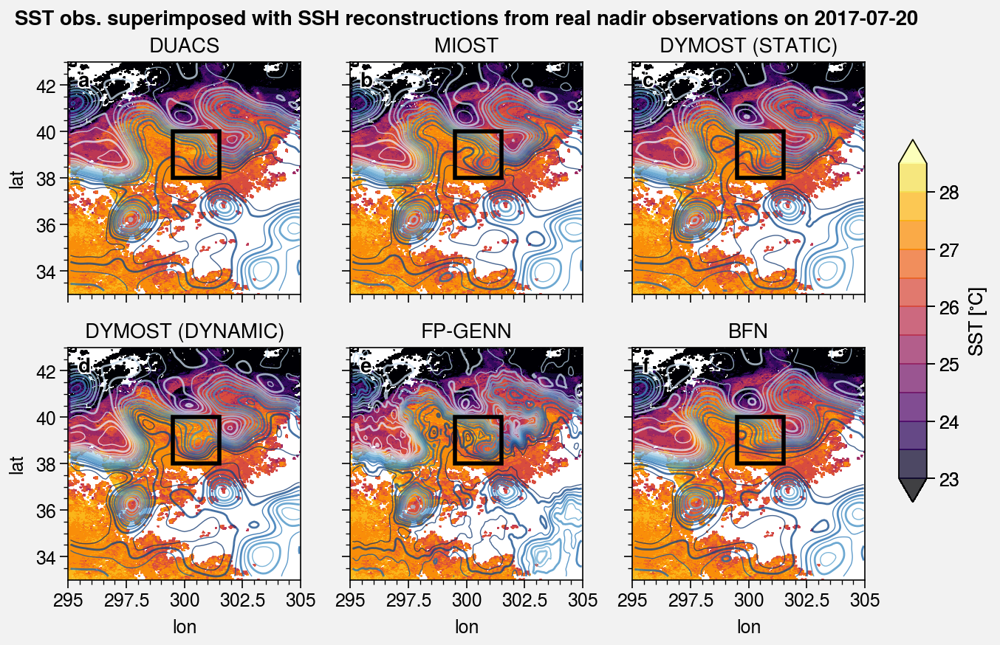

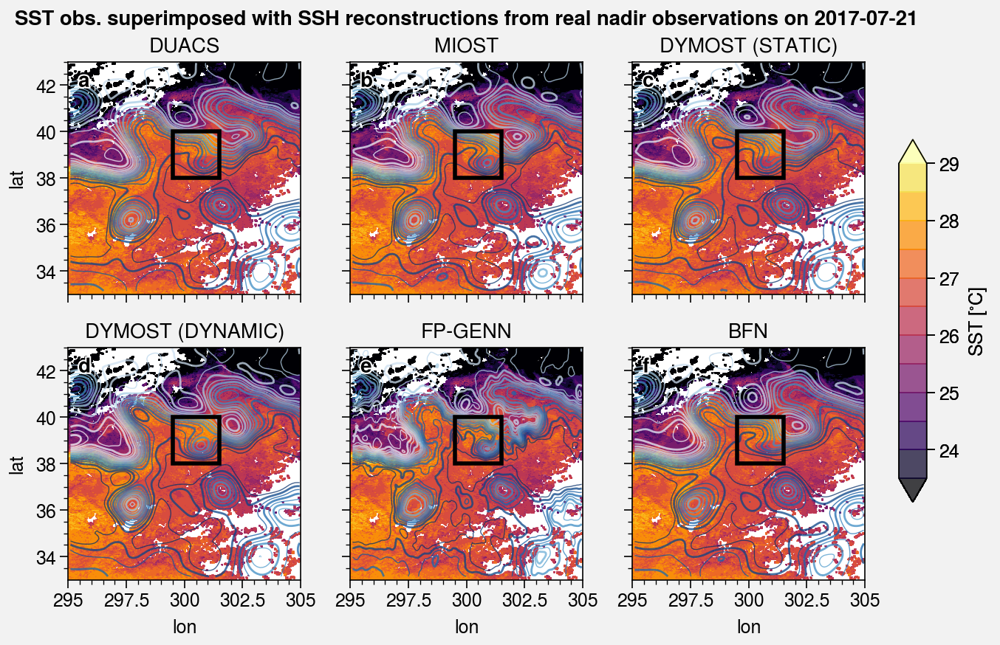

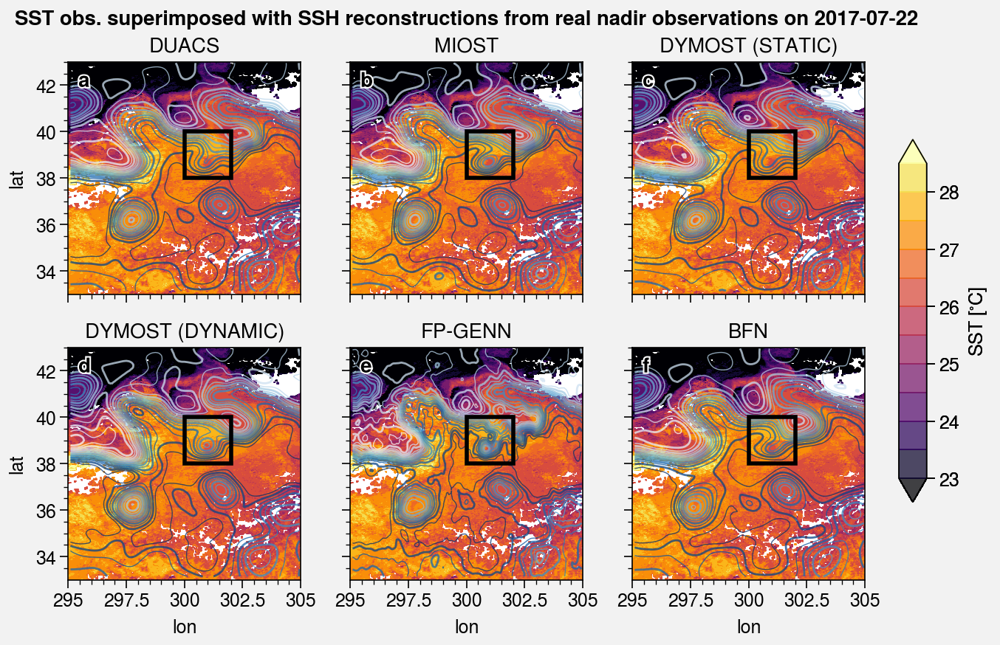

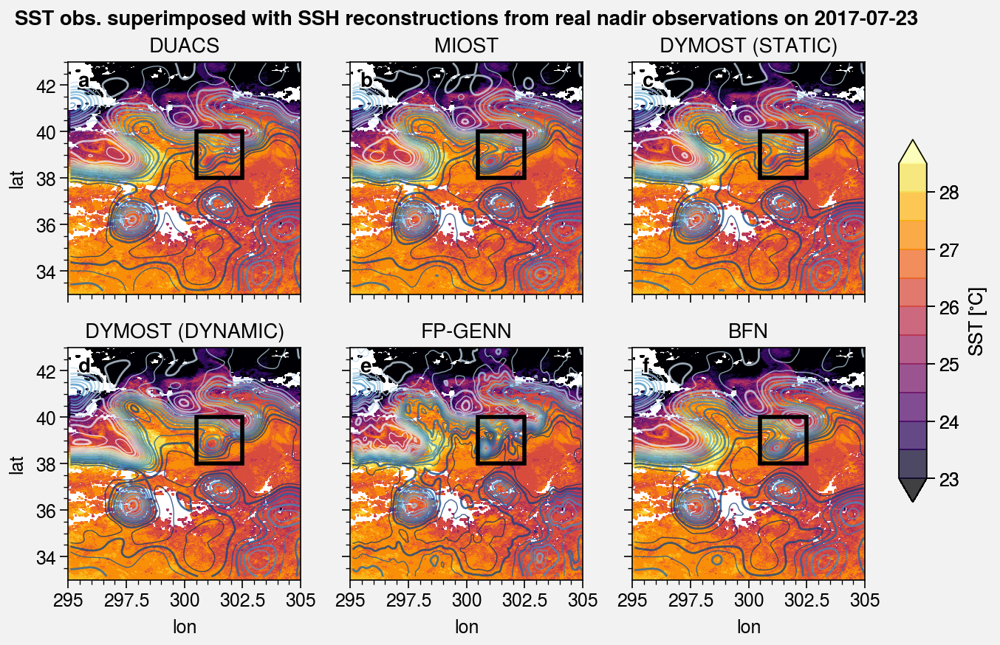

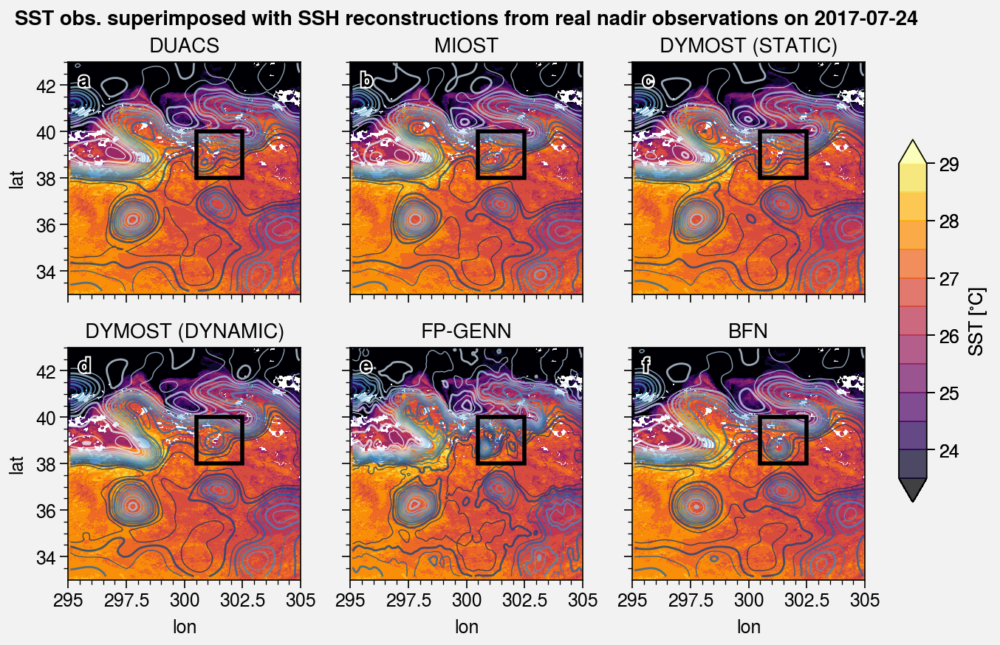

...

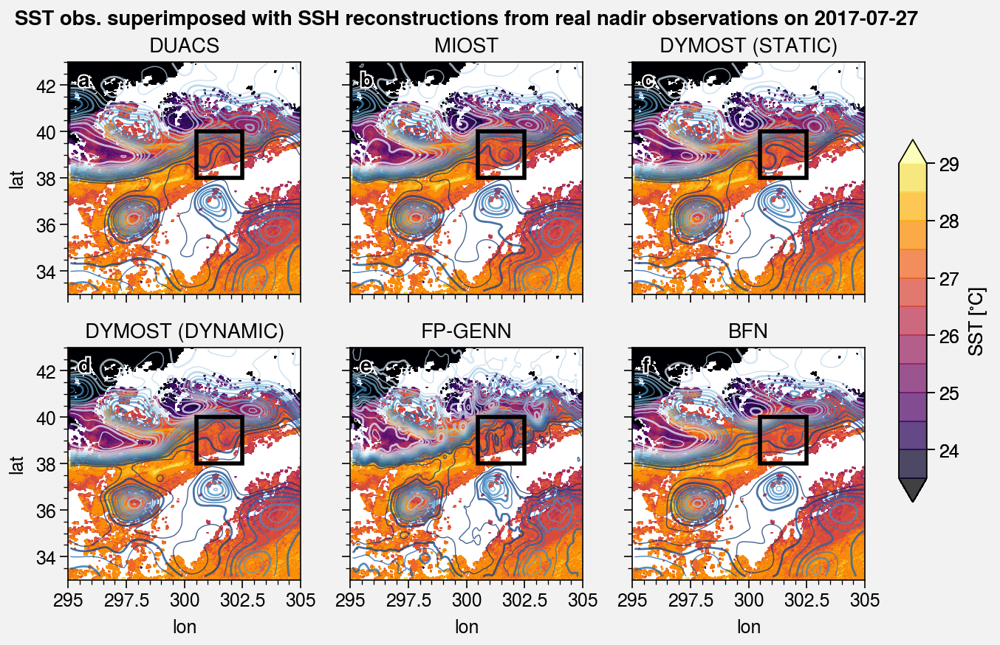

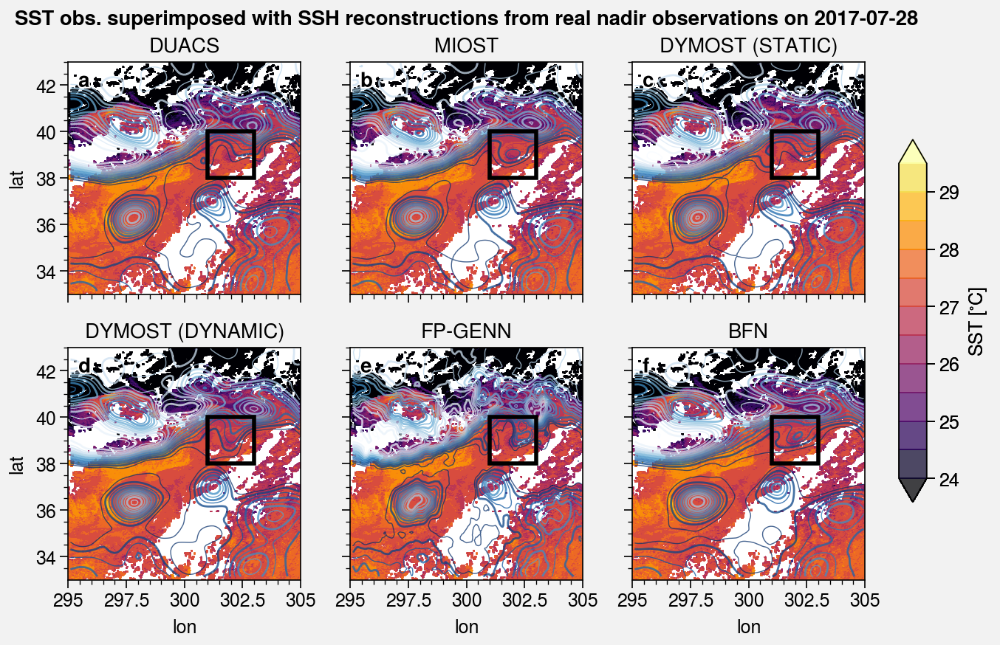

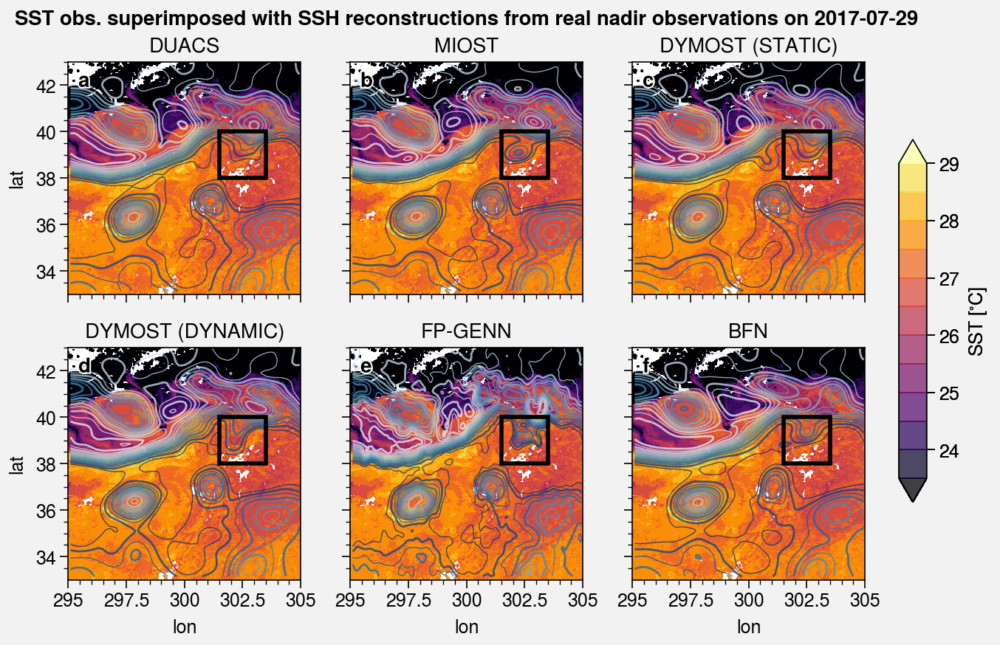

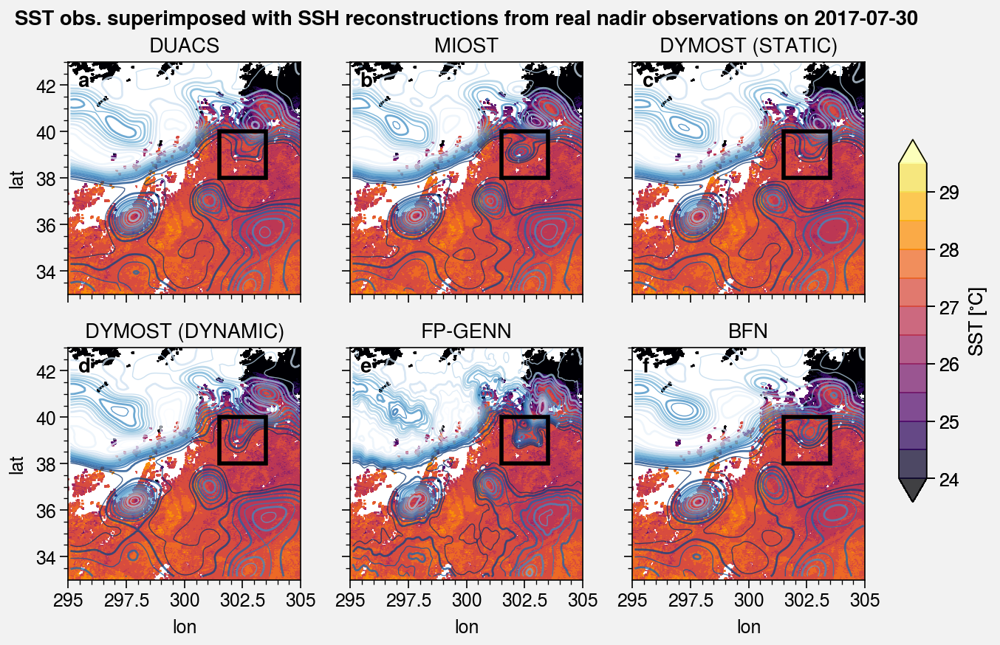

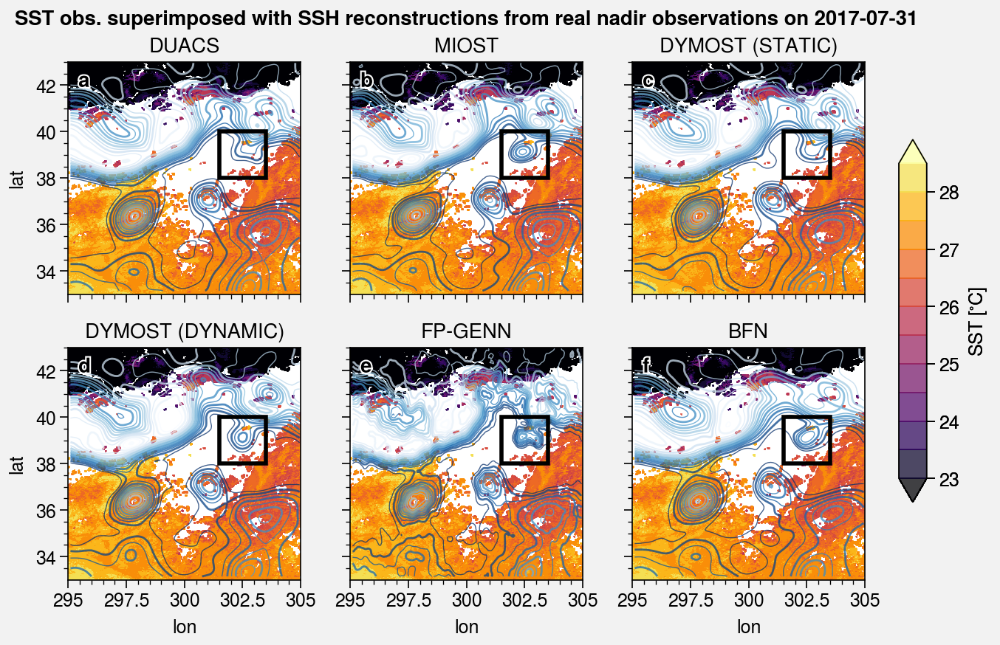

In [ ]:
for day_date, lon_focus, lat_focus in zip(time_vector, lon_vector, lat_vector):
    print(day_date, lon_focus, lat_focus)
    plot_ssh_sst_focus(day_date, lon_focus, lat_focus)